# Preliminaires

In [1]:
import os
import geopandas as gpd
print(os.getcwd())

c:\Users\HP\Desktop\ML for climate risk\ML-for-Climate-Risk\Modélisation\Partie_2


In [ ]:
import pandas as pd

df = pd.read_csv("indicateur/base_indic_complete.csv", sep=",")

C:\Users\HP\AppData\Local\Temp\ipykernel_17584\2680523403.py:3: DtypeWarning: Columns (6,10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("indicateur/base_indic_complete.csv", sep=",")


In [3]:
df.head()

,NUMERO,LAMBX_93,LAMBY_93,LAMBX_2,LAMBY_2,ANNEE,code_insee_commune,commune,code_insee_de_la_region,region,...,ind_sec_T2_25,ind_sec_T2_5,ind_sec_T3_25,ind_sec_T3_5,ind_sec_T4_25,ind_sec_T4_5,ind_sec_T1_off,ind_sec_T2_off,ind_sec_T3_off,ind_sec_T4_off
0,1860,111467,6838785,60000,2401000,2000,29084,Île-Molène,53,Bretagne,...,0,0,0,0,0,0,0,0,0,0
1,2477,127137,6798687,76000,2361000,2000,29168,Plogoff,53,Bretagne,...,0,0,0,0,0,0,0,0,0,0
2,1984,127392,6830663,76000,2393000,2000,29190,Plougonvelin,53,Bretagne,...,0,0,0,0,0,0,0,0,0,0
3,1861,127455,6838657,76000,2401000,2000,29201,Ploumoguer,53,Bretagne,...,0,0,0,0,0,0,0,0,0,0
4,1737,127519,6846652,76000,2409000,2000,29098,Lampaul-Plouarzel,53,Bretagne,...,0,0,0,0,0,0,0,0,0,0


# I) Modélisation 

In [5]:
def make_quarter_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()

    # --- protéger explicitement les cibles ---
    target_cols = [c for c in df.columns if c.startswith("ind_sec_")]

    # colonnes mensuelles météo UNIQUEMENT
    monthly_cols = [
        c for c in df.columns
        if (
            len(c) >= 3
            and c[-3] == "_"
            and c[-2:].isdigit()
            and not c.startswith("ind_sec_")   # <-- PROTECTION
        )
    ]

    base_names = sorted(set([c[:-3] for c in monthly_cols]))

    # règles d’agrégation (inchangées)
    SUM_BASES = {
        "PE","PRELIQ","PRENEI","Q","RUNC","ECOULEMENT",
        "EVAP","ETP","DRAINC","DLI","RESR_NEIGE","RESR_NEIGE6"
    }
    MEAN_BASES = {
        "SWI","swi_unif","HU","SSI","SSWI_10J","SNOW_FRAC",
        "WG_RACINE","WGI_RACINE","HTEURNEIGE","HTEURNEIGE6",
        "HTEURNEIGEX","FF"
    }
    TEMP_BASES = {"T","TINF_H","TSUP_H"}

    for base in base_names:
        cols_12 = [f"{base}_{m:02d}" for m in range(1, 13)]
        if not all(c in df.columns for c in cols_12):
            continue

        for q in [1,2,3,4]:
            q_cols = [f"{base}_{m}" for m in _quarter_months(q)]

            if base in SUM_BASES:
                df[f"{base}_Q{q}_sum"] = df[q_cols].sum(axis=1)
            else:
                df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)

    # on supprime UNIQUEMENT les vraies variables mensuelles météo
    df = df.drop(columns=monthly_cols)

    return df


In [6]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.multioutput import ClassifierChain
from sklearn.ensemble import HistGradientBoostingClassifier

from sklearn.metrics import (
    roc_auc_score, f1_score, precision_score, recall_score,
    accuracy_score, confusion_matrix, brier_score_loss
)

# =========================================================
# 0) PARAMÈTRES SPLIT TEMPOREL
# =========================================================
TRAIN_END = 2019
TEST_START = 2020

ID_COL = "NUMERO"
TIME_COL = "ANNEE"

# =========================================================
# 1) FEATURES: agrégation mensuel -> trimestriel
#    (sum/mean/min selon type)
# =========================================================

def _quarter_months(q: int):
    """q in {1,2,3,4} -> list of months as strings '01'..'12'."""
    if q == 1: return ["01", "02", "03"]
    if q == 2: return ["04", "05", "06"]
    if q == 3: return ["07", "08", "09"]
    if q == 4: return ["10", "11", "12"]
    raise ValueError("q must be 1..4")


# =========================================================
# 2) CIBLES + LAG DU VECTEUR CIBLE (ordre 1)
# =========================================================

def get_target_cols(threshold: str):
    """
    threshold in {"5","25","off"}
    -> ["ind_sec_T1_x", ..., "ind_sec_T4_x"]
    """
    assert threshold in {"5", "25", "off"}
    return [f"ind_sec_T{k}_{threshold}" for k in [1,2,3,4]]

def add_lagged_targets(df: pd.DataFrame, target_cols: list, lag: int = 1):
    """
    Ajoute y_{t-1} pour le même NUMERO, et drop les lignes avec NA dues au lag.
    """
    df = df.sort_values([ID_COL, TIME_COL]).copy()
    for c in target_cols:
        df[f"{c}_lag{lag}"] = df.groupby(ID_COL)[c].shift(lag)
    # drop lignes où au moins un lag est manquant (typiquement première année de chaque NUMERO)
    lag_cols = [f"{c}_lag{lag}" for c in target_cols]
    return df.dropna(subset=lag_cols).copy()

# =========================================================
# 3) SPLIT TRAIN / TEST
# =========================================================

def temporal_split(df: pd.DataFrame):
    train = df[df[TIME_COL] <= TRAIN_END].copy()
    test  = df[df[TIME_COL] >= TEST_START].copy()
    return train, test

# =========================================================
# 4) PREPROCESSING + MODELS
# =========================================================

def make_preprocessor(feature_cols):
    """
    Préprocessing léger:
    - imputation median
    - standardisation (utile surtout pour LogReg)
    """
    numeric_features = feature_cols
    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler(with_mean=True, with_std=True)),
    ])
    return ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
        ],
        remainder="drop"
    )

def make_models():
    """
    Trois familles:
    (A) 4 LogReg indépendantes via MultiOutputClassifier
    (B) ClassifierChain(LogReg) ordre T1->T4
    (C) HistGradientBoosting + MultiOutput (non-linéaire, rapide)
    """
    logreg = LogisticRegression(
        solver="lbfgs",
        max_iter=200,
        class_weight="balanced",
        n_jobs=None
    )

    hgb = HistGradientBoostingClassifier(
        max_depth=6,
        learning_rate=0.08,
        max_iter=250
    )

    models = {
        "multi_logreg": MultiOutputClassifier(logreg, n_jobs=None),
        "chain_logreg": ClassifierChain(logreg, order=[0,1,2,3], random_state=0),
        "multi_hgb": MultiOutputClassifier(hgb, n_jobs=None),
    }
    return models

# =========================================================
# 5) MÉTRIQUES (par trimestre + global)
# =========================================================

def evaluate_multilabel(y_true: np.ndarray, y_pred: np.ndarray, y_proba: np.ndarray | None = None):
    """
    y_true, y_pred: shape (n_samples, 4)
    y_proba: shape (n_samples, 4) si dispo (proba classe 1)
    """
    out = {}

    # global multi-label
    out["exact_match"] = float(np.mean(np.all(y_true == y_pred, axis=1)))
    out["hamming_acc"] = float(np.mean(y_true == y_pred))  # 1 - hamming loss

    # macro metrics across labels (treat each quarter equally)
    out["macro_f1"] = float(np.mean([f1_score(y_true[:,k], y_pred[:,k], zero_division=0) for k in range(4)]))
    out["macro_recall"] = float(np.mean([recall_score(y_true[:,k], y_pred[:,k], zero_division=0) for k in range(4)]))
    out["macro_precision"] = float(np.mean([precision_score(y_true[:,k], y_pred[:,k], zero_division=0) for k in range(4)]))

    # per-quarter
    for k in range(4):
        out[f"Q{k+1}_acc"] = float(accuracy_score(y_true[:,k], y_pred[:,k]))
        out[f"Q{k+1}_f1"] = float(f1_score(y_true[:,k], y_pred[:,k], zero_division=0))
        out[f"Q{k+1}_recall"] = float(recall_score(y_true[:,k], y_pred[:,k], zero_division=0))
        out[f"Q{k+1}_precision"] = float(precision_score(y_true[:,k], y_pred[:,k], zero_division=0))

        if y_proba is not None:
            # AUC: uniquement si les deux classes existent
            if len(np.unique(y_true[:,k])) == 2:
                out[f"Q{k+1}_auc"] = float(roc_auc_score(y_true[:,k], y_proba[:,k]))
            else:
                out[f"Q{k+1}_auc"] = np.nan

            out[f"Q{k+1}_brier"] = float(brier_score_loss(y_true[:,k], y_proba[:,k]))

    return out

# =========================================================
# 6) RUN: une expérience complète pour un seuil
# =========================================================

def run_for_threshold(df_raw: pd.DataFrame, threshold: str):
    """
    threshold in {"5","25","off"}
    """
    print(f"\n======================")
    print(f"   RUN threshold={threshold}")
    print(f"======================")

    # 1) Features trimestrielles (léger)
    df = make_quarter_features(df_raw)

    # 2) Target + lag
    target_cols = get_target_cols(threshold)
    df = add_lagged_targets(df, target_cols, lag=1)

    # 3) Split
    train_df, test_df = temporal_split(df)

    # 4) Définir X, y
    lag_cols = [f"{c}_lag1" for c in target_cols]

    # Features "statiques" utiles (géo/sol). Tu peux en ajouter/retirer.
    static_cols = [c for c in ["LAMBX_93","LAMBY_93","argile_niveau","code_insee_de_la_region"] if c in df.columns]

    # Features trimestrielles créées (se terminent par _Q1_*, _Q2_*, _Q3_*, _Q4_*)
    qfeat_cols = [c for c in df.columns if ("_Q1_" in c or "_Q2_" in c or "_Q3_" in c or "_Q4_" in c)]

    # On ne met PAS les identifiants bruts
    forbidden = set([ID_COL, TIME_COL] + target_cols)
    feature_cols = [c for c in (static_cols + qfeat_cols + lag_cols) if c not in forbidden]

    X_train = train_df[feature_cols]
    y_train = train_df[target_cols].astype(int).values

    X_test = test_df[feature_cols]
    y_test = test_df[target_cols].astype(int).values

    print(f"Train rows: {len(train_df):,} | Test rows: {len(test_df):,}")
    print(f"n_features: {len(feature_cols):,} (incluant {len(lag_cols)} lags de y)")

    # 5) Preprocess + models
    # Pour les modèles arbres (HGB), standardiser n’est pas nécessaire,
    # mais on garde le même preprocess pour simplicité (ça ne casse pas).
    preprocessor = make_preprocessor(feature_cols)
    models = make_models()

    results = {}
    fitted = {}

    for name, clf in models.items():
        pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", clf),
        ])

        print(f"\n--- Training: {name}")
        pipe.fit(X_train, y_train)

        # prédictions
        y_pred = pipe.predict(X_test)

        # probabilités (si dispo)
        y_proba = None
        try:
            # MultiOutputClassifier: list de probas par sortie
            if hasattr(pipe.named_steps["clf"], "estimators_"):
                probas = []
                for est in pipe.named_steps["clf"].estimators_:
                    p = est.predict_proba(pipe.named_steps["prep"].transform(X_test))[:, 1]
                    probas.append(p)
                y_proba = np.vstack(probas).T

            # ClassifierChain: predict_proba renvoie (n, n_labels, 2) selon versions; on tente proprement
            elif hasattr(pipe.named_steps["clf"], "predict_proba"):
                p = pipe.predict_proba(X_test)
                p = np.asarray(p)
                if p.ndim == 3 and p.shape[2] == 2:
                    y_proba = p[:, :, 1]
        except Exception:
            y_proba = None

        metrics = evaluate_multilabel(y_test, y_pred, y_proba=y_proba)
        results[name] = metrics
        fitted[name] = pipe

        print(f"exact_match={metrics['exact_match']:.3f} | hamming_acc={metrics['hamming_acc']:.3f} | macro_f1={metrics['macro_f1']:.3f}")

    # Tableau résultats
    res_df = pd.DataFrame(results).T.sort_values("macro_f1", ascending=False)
    return res_df, fitted, feature_cols

# =========================================================
# 7) LANCEMENT SUR Q5, Q25, Qoff
# =========================================================
# Exemple d'usage:
# res5, models5, feats5 = run_for_threshold(df, "5")
# res25, models25, feats25 = run_for_threshold(df, "25")
# resoff, modelsoff, featsoff = run_for_threshold(df, "off")


## 1) Indicateur q5

In [7]:
res5, models5, feats5 = run_for_threshold(df, "5")
#print(res5)


   RUN threshold=5


C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

Train rows: 188,859 | Test rows: 49,460
n_features: 114 (incluant 4 lags de y)

--- Training: multi_logreg
exact_match=0.760 | hamming_acc=0.925 | macro_f1=0.652

--- Training: chain_logreg
exact_match=0.760 | hamming_acc=0.925 | macro_f1=0.651

--- Training: multi_hgb
exact_match=0.853 | hamming_acc=0.958 | macro_f1=0.743


In [13]:
res5

,exact_match,hamming_acc,macro_f1,macro_recall,macro_precision,Q1_acc,Q1_f1,Q1_recall,Q1_precision,Q1_auc,...,Q3_recall,Q3_precision,Q3_auc,Q3_brier,Q4_acc,Q4_f1,Q4_recall,Q4_precision,Q4_auc,Q4_brier
multi_hgb,0.852264,0.957835,0.744368,0.731861,0.761475,0.977396,0.725577,0.742341,0.709554,0.988445,...,0.801451,0.888715,0.983820,0.046596,0.984351,0.619843,0.652534,0.590271,0.990175,0.010832
multi_logreg,0.759604,0.925334,0.652143,0.929834,0.515940,0.938273,0.544668,0.917127,0.387357,0.979199,...,0.969374,0.684204,0.971401,0.079507,0.964699,0.501997,0.910031,0.346593,0.987588,0.026611
chain_logreg,0.760129,0.924641,0.650635,0.924956,0.514664,0.938273,0.544668,0.917127,0.387357,NaN,...,0.970505,0.675034,NaN,NaN,0.965305,0.501163,0.891417,0.348564,NaN,NaN


| Modèle        | macro-F1  | macro-recall | macro-precision |
| ------------- | --------- | ------------ | --------------- |
| **multi_hgb** | **0.743** | 0.716        | **0.774**       |
| multi_logreg  | 0.652     | **0.930**    | 0.516           |
| chain_logreg  | 0.651     | 0.925        | 0.515           |


Interprétation

Les modèles linéaires présentent un rappel très élevé, traduisant une forte capacité de détection des épisodes sévères.

En contrepartie, leur précision est faible, ce qui conduit à une sur-détection des épisodes de sécheresse.

Le modèle de gradient boosting (multi_hgb) offre un meilleur compromis précision–rappel, avec une nette amélioration du F1-score et de l’exact match accuracy

## 2) Indicateur q25

In [8]:
res25, models25, feats25 = run_for_threshold(df, "25")
#print(res25)


   RUN threshold=25


C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

Train rows: 188,859 | Test rows: 49,460
n_features: 114 (incluant 4 lags de y)

--- Training: multi_logreg


c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproc

exact_match=0.733 | hamming_acc=0.922 | macro_f1=0.870

--- Training: chain_logreg


c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproc

exact_match=0.732 | hamming_acc=0.921 | macro_f1=0.870

--- Training: multi_hgb
exact_match=0.787 | hamming_acc=0.941 | macro_f1=0.898


In [17]:
res25

,exact_match,hamming_acc,macro_f1,macro_recall,macro_precision,Q1_acc,Q1_f1,Q1_recall,Q1_precision,Q1_auc,...,Q3_recall,Q3_precision,Q3_auc,Q3_brier,Q4_acc,Q4_f1,Q4_recall,Q4_precision,Q4_auc,Q4_brier
multi_hgb,0.784129,0.940002,0.896369,0.903718,0.891912,0.927598,0.863409,0.920761,0.812783,0.980435,...,0.958732,0.950540,0.994356,0.029716,0.932208,0.831465,0.789896,0.877653,0.977331,0.051303
multi_logreg,0.733381,0.921553,0.870078,0.917017,0.829739,0.893793,0.810190,0.912057,0.728792,0.961740,...,0.971956,0.916893,0.988088,0.039632,0.909543,0.796673,0.837074,0.759993,0.965949,0.066610
chain_logreg,0.732147,0.921194,0.869670,0.917284,0.828794,0.893793,0.810190,0.912057,0.728792,NaN,...,0.970087,0.916943,NaN,NaN,0.908775,0.795819,0.839748,0.756257,NaN,NaN


| Modèle        | macro-F1  | macro-recall | macro-precision |
| ------------- | --------- | ------------ | --------------- |
| **multi_hgb** | **0.898** | **0.906**    | **0.894**       |
| multi_logreg  | 0.870     | 0.917        | 0.830           |
| chain_logreg  | 0.870     | 0.917        | 0.829           |


Interprétation

Pour Q25, les trois modèles présentent des performances élevées, traduisant un signal climatique plus fréquent et plus facile à prédire.

Les modèles logistiques conservent un rappel légèrement supérieur, mais au prix d’une précision plus faible.

Le gradient boosting reste dominant grâce à une meilleure précision, ce qui se traduit par le meilleur F1-score global et une meilleure cohérence des prédictions multi-trimestres.

## 3) Indicateur officiel

In [9]:
resoff, modelsoff, featsoff = run_for_threshold(df, "off")
#print(resoff)


   RUN threshold=off


C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

Train rows: 188,859 | Test rows: 49,460
n_features: 114 (incluant 4 lags de y)

--- Training: multi_logreg


c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproc

exact_match=0.725 | hamming_acc=0.909 | macro_f1=0.502

--- Training: chain_logreg


c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\USER\miniconda3\envs\_envclr\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 200 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=200).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproc

exact_match=0.724 | hamming_acc=0.905 | macro_f1=0.490

--- Training: multi_hgb
exact_match=0.861 | hamming_acc=0.960 | macro_f1=0.634


In [21]:
resoff

,exact_match,hamming_acc,macro_f1,macro_recall,macro_precision,Q1_acc,Q1_f1,Q1_recall,Q1_precision,Q1_auc,...,Q3_recall,Q3_precision,Q3_auc,Q3_brier,Q4_acc,Q4_f1,Q4_recall,Q4_precision,Q4_auc,Q4_brier
multi_hgb,0.860898,0.959892,0.656610,0.704762,0.626310,0.985847,0.764468,0.726807,0.806246,0.992277,...,0.787555,0.734333,0.967455,0.053186,0.989911,0.451045,0.475638,0.428870,0.991548,0.006861
multi_logreg,0.725495,0.908603,0.502383,0.919761,0.351533,0.938718,0.457102,0.816379,0.317413,0.910971,...,0.959396,0.490124,0.953270,0.120026,0.973534,0.390879,0.974478,0.244470,0.994632,0.020689
chain_logreg,0.723797,0.905120,0.489710,0.915542,0.340855,0.938718,0.457102,0.816379,0.317413,NaN,...,0.961613,0.469581,NaN,NaN,0.969571,0.359302,0.979118,0.220021,NaN,NaN


| Modèle        | macro-F1  | macro-recall | macro-precision |
| ------------- | --------- | ------------ | --------------- |
| **multi_hgb** | **0.649** | 0.684        | **0.630**       |
| multi_logreg  | 0.502     | **0.920**    | 0.352           |
| chain_logreg  | 0.490     | 0.916        | 0.341           |


Interprétation

Les modèles logistiques atteignent un rappel très élevé, mais avec une précision extrêmement faible, ce qui induit de nombreuses fausses alertes.

Le modèle de gradient boosting réduit fortement ces fausses alertes, améliorant significativement la précision, au prix d’un rappel légèrement plus faible.

Le gain sur le F1-score macro et sur l’exact match accuracy montre que le compromis obtenu par multi_hgb est largement préférable dans un contexte opérationnel.

# II) COMPARAISON DES MODELES

Quel que soit le seuil considéré, le modèle de gradient boosting multi-sortie présente le meilleur compromis entre précision et rappel.
Les modèles logistiques, bien qu’efficaces en termes de détection, souffrent d’une sur-prédiction systématique des épisodes de sécheresse.
L’approche retenue permet ainsi d’améliorer la fiabilité des alertes tout en conservant une bonne capacité de détection.

On affiche donc le tableau  des résultats du meilleur modèle (multi_hgb) pour les 3 indicateurs.

| Seuil    | Exact match | Hamming acc | Macro-F1  | Macro-recall | Macro-precision |
| -------- | ----------- | ----------- | --------- | ------------ | --------------- |
| **Q5**   | **0.851**   | 0.958       | 0.743     | 0.716        | **0.774**       |
| **Q25**  | 0.787       | 0.941       | **0.898** | **0.906**    | 0.894           |
| **Qoff** | **0.858**   | **0.959**   | 0.649     | 0.684        | 0.630           |


Le tableau comparatif met en évidence des performances contrastées selon la définition de la sécheresse.
La sécheresse modérée (Q25) est la plus facile à prédire, avec un F1-score macro proche de 0.9, reflétant un signal climatique fréquent et bien capturé par les variables explicatives.
La sécheresse sévère (Q5), bien que plus rare, présente un excellent exact match accuracy, traduisant la capacité du modèle à prédire correctement l’ensemble du vecteur trimestriel.
Enfin, la définition officielle (Qoff) apparaît plus hétérogène : le F1-score est plus faible, mais l’exact match accuracy reste élevé, indiquant une bonne cohérence globale des prédictions.
Ces résultats confirment la robustesse du modèle de gradient boosting multi-sortie pour des contextes de sécheresse aux caractéristiques variées.

# III) PERMUTATION IMPORTANCE OF FEATURES

In [37]:
from sklearn.inspection import permutation_importance

def permutation_importance_by_quarter(
    pipe,
    X,
    y,
    feature_names,
    n_repeats=3,
    random_state=0,
    scoring="f1"
):
    """
    Retourne un dictionnaire :
    { 'T1': DataFrame importance,
      'T2': DataFrame importance,
      'T3': DataFrame importance,
      'T4': DataFrame importance }
    """

    # transformer X une seule fois (important pour la vitesse)
    X_trans = pipe.named_steps["prep"].transform(X)

    importances = {}

    for k, est in enumerate(pipe.named_steps["clf"].estimators_):
        print(f"Permutation importance — T{k+1}")

        r = permutation_importance(
            est,
            X_trans,
            y[:, k],
            n_repeats=n_repeats,
            random_state=random_state,
            scoring=scoring,
            n_jobs=-1
        )

        df_imp = (
            pd.DataFrame({
                "feature": feature_names,
                "importance_mean": r.importances_mean,
                "importance_std": r.importances_std,
            })
            .sort_values("importance_mean", ascending=False)
            .reset_index(drop=True)
        )

        importances[f"T{k+1}"] = df_imp

    return importances


In [31]:
pipe = models5["multi_hgb"]
pipe.named_steps["clf"].estimators_


[HistGradientBoostingClassifier(learning_rate=0.08, max_depth=6, max_iter=250),
 HistGradientBoostingClassifier(learning_rate=0.08, max_depth=6, max_iter=250),
 HistGradientBoostingClassifier(learning_rate=0.08, max_depth=6, max_iter=250),
 HistGradientBoostingClassifier(learning_rate=0.08, max_depth=6, max_iter=250)]

In [35]:
# 1) même feature engineering
df_feat = make_quarter_features(df)

# 2) mêmes cibles
target_cols = get_target_cols("5")

# 3) même lag
df_feat = add_lagged_targets(df_feat, target_cols, lag=1)

# 4) même split temporel
train_df = df_feat[df_feat["ANNEE"] <= 2019]
test_df  = df_feat[df_feat["ANNEE"] >= 2020]


C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

In [38]:
X_test = test_df[feats5]
y_test = test_df[get_target_cols("5")].values

importances_Q5 = permutation_importance_by_quarter(
    pipe=models5["multi_hgb"],
    X=X_test,
    y=y_test,
    feature_names=feats5,
    scoring="f1"
)

Permutation importance — T1
Permutation importance — T2
Permutation importance — T3
Permutation importance — T4


In [61]:
importances_Q5["T1"].head(10)



,feature,importance_mean,importance_std
0,SSWI_10J_Q1_mean,0.575055,0.001688
1,swi_unif_Q1_mean,0.366128,0.006593
2,ind_sec_T1_5_lag1,0.071443,0.000923
3,code_insee_de_la_region,0.020068,0.001873
4,swi_unif_Q2_mean,0.018090,0.000933
5,T_Q1_mean,0.017173,0.002470
6,SWI_Q1_mean,0.010919,0.002090
7,HU_Q3_mean,0.010113,0.000720
8,swi_unif_Q4_mean,0.009687,0.000338
9,ind_sec_T3_5_lag1,0.008907,0.000842


In [62]:
importances_Q5["T2"].head(10)


,feature,importance_mean,importance_std
0,SSWI_10J_Q2_mean,0.599815,0.001915
1,ind_sec_T2_5_lag1,0.041897,0.001095
2,swi_unif_Q2_mean,0.028195,0.000915
3,SSI_Q2_mean,0.015284,0.001045
4,SSWI_10J_Q1_mean,0.014543,0.000753
5,SSWI_10J_Q4_mean,0.013409,0.001495
6,swi_unif_Q1_mean,0.008554,0.000364
7,ETP_Q2_sum,0.007470,0.000514
8,HU_Q2_mean,0.007244,0.000419
9,PRELIQ_Q2_sum,0.004478,0.001537


In [63]:
importances_Q5["T3"].head(10)


,feature,importance_mean,importance_std
0,SSWI_10J_Q3_mean,0.534145,0.002699
1,swi_unif_Q3_mean,0.036787,0.000664
2,SSWI_10J_Q2_mean,0.036413,0.001334
3,SSI_Q3_mean,0.030193,0.000723
4,ind_sec_T3_5_lag1,0.010749,0.000382
5,PE_Q3_sum,0.008246,0.000778
6,code_insee_de_la_region,0.005005,0.000354
7,HU_Q1_mean,0.004142,0.000363
8,PRENEI_Q4_sum,0.003733,0.000153
9,PRELIQ_Q2_sum,0.003381,0.000297


In [64]:
importances_Q5["T4"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q4_mean,0.551402,0.003537
1,swi_unif_Q4_mean,0.399383,0.002584
2,PRELIQ_Q4_sum,0.055879,0.000608
3,SSI_Q2_mean,0.033704,0.003216
4,RUNC_Q4_sum,0.030453,0.001306
5,PE_Q4_sum,0.030133,0.002548
6,swi_unif_Q3_mean,0.028590,0.004763
7,SSWI_10J_Q1_mean,0.009676,0.002116
8,Q_Q2_sum,0.007263,0.002082
9,SSI_Q4_mean,0.006951,0.000676


In [49]:
# 1) Feature engineering trimestriel
df_feat = make_quarter_features(df)

# 2) Colonnes cibles Q25
target_cols_25 = get_target_cols("25")

# 3) Création des lags Q25 (OBLIGATOIRE)
df_feat = add_lagged_targets(df_feat, target_cols_25, lag=1)

# 4) Split temporel
train_df = df_feat[df_feat["ANNEE"] <= 2019]
test_df  = df_feat[df_feat["ANNEE"] >= 2020]

# 5) Construire X_test et y_test avec EXACTEMENT les mêmes features
X_test = test_df[feats25]
y_test = test_df[target_cols_25].values


C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

In [50]:
X_test = test_df[feats25]
y_test = test_df[get_target_cols("25")].values

importances_Q25 = permutation_importance_by_quarter(
    pipe=models25["multi_hgb"],
    X=X_test,
    y=y_test,
    feature_names=feats25,
    scoring="f1"
)

Permutation importance — T1
Permutation importance — T2
Permutation importance — T3
Permutation importance — T4


In [65]:
importances_Q25["T1"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q1_mean,0.497082,0.003078
1,swi_unif_Q1_mean,0.181642,0.000558
2,ind_sec_T1_25_lag1,0.015111,0.000405
3,code_insee_de_la_region,0.009455,0.001097
4,DRAINC_Q1_sum,0.009344,0.000630
5,SSI_Q1_mean,0.006667,0.000162
6,PRELIQ_Q1_sum,0.006302,0.000091
7,SSWI_10J_Q4_mean,0.005370,0.000089
8,ind_sec_T4_25_lag1,0.004789,0.000242
9,SWI_Q1_mean,0.004098,0.000238


In [66]:
importances_Q25["T2"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q2_mean,0.421021,0.000134
1,swi_unif_Q2_mean,0.042288,0.000371
2,SSWI_10J_Q3_mean,0.008327,0.000314
3,SSI_Q2_mean,0.006811,0.000233
4,swi_unif_Q1_mean,0.005226,0.000245
5,PRELIQ_Q2_sum,0.003796,0.000299
6,ETP_Q2_sum,0.003561,0.000375
7,ind_sec_T2_25_lag1,0.003545,0.000280
8,ETP_Q1_sum,0.001782,0.000544
9,PE_Q2_sum,0.001728,0.000173


In [67]:
importances_Q25["T3"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q3_mean,0.413774,0.001407
1,swi_unif_Q3_mean,0.053188,0.001629
2,PE_Q3_sum,0.007737,0.000480
3,code_insee_de_la_region,0.003708,0.000105
4,SSI_Q2_mean,0.002849,0.000216
5,SSWI_10J_Q4_mean,0.002731,0.000053
6,PRELIQ_Q3_sum,0.002135,0.000125
7,swi_unif_Q2_mean,0.002017,0.000097
8,SSI_Q3_mean,0.001831,0.000130
9,TINF_H_Q3_mean,0.001454,0.000174


In [68]:
importances_Q25["T4"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q4_mean,0.573351,0.001902
1,swi_unif_Q4_mean,0.195720,0.001197
2,ind_sec_T4_25_lag1,0.019973,0.000643
3,SSI_Q2_mean,0.006513,0.000919
4,TSUP_H_Q1_mean,0.005780,0.000451
5,RESR_NEIGE_Q1_sum,0.005516,0.000081
6,HU_Q2_mean,0.004743,0.000266
7,PE_Q3_sum,0.004168,0.000161
8,code_insee_de_la_region,0.003687,0.000358
9,ETP_Q2_sum,0.002889,0.000019


In [55]:
# 1) Feature engineering trimestriel
df_feat = make_quarter_features(df)

# 2) Colonnes cibles Q25
target_cols_off = get_target_cols("off")

# 3) Création des lags Q25 (OBLIGATOIRE)
df_feat = add_lagged_targets(df_feat, target_cols_off, lag=1)

# 4) Split temporel
train_df = df_feat[df_feat["ANNEE"] <= 2019]
test_df  = df_feat[df_feat["ANNEE"] >= 2020]

# 5) Construire X_test et y_test avec EXACTEMENT les mêmes features
X_test = test_df[featsoff]
y_test = test_df[target_cols_off].values


C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27756\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

In [56]:
X_test = test_df[featsoff]
y_test = test_df[get_target_cols("off")].values

importances_Qoff = permutation_importance_by_quarter(
    pipe=modelsoff["multi_hgb"],
    X=X_test,
    y=y_test,
    feature_names=featsoff,
    scoring="f1"
)

Permutation importance — T1
Permutation importance — T2
Permutation importance — T3
Permutation importance — T4


In [69]:
importances_Qoff["T1"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q1_mean,0.499224,0.006206
1,ind_sec_T1_off_lag1,0.228033,0.001060
2,swi_unif_Q1_mean,0.216004,0.007829
3,Q_Q4_sum,0.200764,0.001969
4,Q_Q1_sum,0.131042,0.002867
5,code_insee_de_la_region,0.097961,0.004423
6,PRENEI_Q4_sum,0.027261,0.000431
7,WGI_RACINE_Q1_mean,0.019455,0.000712
8,DRAINC_Q3_sum,0.017892,0.001055
9,PRELIQ_Q1_sum,0.012386,0.001822


In [70]:
importances_Qoff["T2"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q2_mean,0.487788,0.007042
1,swi_unif_Q2_mean,0.013219,0.000438
2,ind_sec_T2_off_lag1,0.010838,0.000177
3,FF_Q2_mean,0.008301,0.000539
4,TSUP_H_Q1_mean,0.006875,0.001091
5,FF_Q1_mean,0.006593,0.000274
6,swi_unif_Q1_mean,0.006039,0.001152
7,SSWI_10J_Q1_mean,0.004711,0.000169
8,PE_Q4_sum,0.004237,0.000696
9,Q_Q2_sum,0.003385,0.001271


In [71]:
importances_Qoff["T3"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q3_mean,0.491747,0.006926
1,swi_unif_Q3_mean,0.049035,0.001233
2,SSI_Q3_mean,0.032630,0.001205
3,ind_sec_T3_off_lag1,0.022673,0.000794
4,SSWI_10J_Q2_mean,0.015418,0.000626
5,ETP_Q3_sum,0.012609,0.000956
6,code_insee_de_la_region,0.012215,0.000361
7,SSI_Q2_mean,0.009770,0.002085
8,HU_Q1_mean,0.009602,0.000492
9,PE_Q3_sum,0.008239,0.002292


In [72]:
importances_Qoff["T4"].head(10)

,feature,importance_mean,importance_std
0,SSWI_10J_Q4_mean,0.408501,0.009436
1,swi_unif_Q4_mean,0.345403,0.005966
2,PRELIQ_Q4_sum,0.186767,0.011513
3,Q_Q3_sum,0.130992,0.001668
4,RUNC_Q4_sum,0.062165,0.000661
5,SSWI_10J_Q3_mean,0.042786,0.010250
6,RESR_NEIGE_Q1_sum,0.031575,0.002436
7,PRELIQ_Q1_sum,0.025169,0.003377
8,ind_sec_T2_off_lag1,0.020639,0.001441
9,DRAINC_Q1_sum,0.019586,0.004265


In [76]:
# ============================================================
# TABLEAU FINAL — IMPORTANCE PAR FAMILLE × INDICATEUR
# ============================================================

import pandas as pd

# ------------------------------------------------------------
# 1) Familles (identiques à la heatmap)
# ------------------------------------------------------------
FAMILIES = {
    "Hydrique court terme": ["SSWI_10J"],
    "Hydrique moyen terme": ["SWI", "swi_unif", "SSI"],
    "Flux hydrologiques": [
        "PE", "PRELIQ", "PRENEI",
        "Q_", "RUNC", "ECOULEMENT",
        "ETP", "EVAP", "DRAINC",
        "RESR_NEIGE"
    ],
    "Persistance (lag)": ["ind_sec_"],
    "Variables spatiales": ["code_insee", "LAMBX", "LAMBY"]
}

ORDERED_FAMILIES = [
    "Hydrique court terme",
    "Hydrique moyen terme",
    "Flux hydrologiques",
    "Persistance (lag)",
    "Variables spatiales",
    "Autres"
]

# ------------------------------------------------------------
# 2) Feature → famille
# ------------------------------------------------------------
def map_family(feature):
    for fam, patterns in FAMILIES.items():
        for p in patterns:
            if p in feature:
                return fam
    return "Autres"

# ------------------------------------------------------------
# 3) Agrégation par famille (tous trimestres confondus)
# ------------------------------------------------------------
def aggregate_by_family(importances_dict):
    """
    importances_dict : ex importances_Q5
    """
    frames = []

    for df in importances_dict.values():
        tmp = df.copy()
        tmp["family"] = tmp["feature"].apply(map_family)
        frames.append(tmp)

    all_df = pd.concat(frames)

    return (
        all_df.groupby("family")["importance_mean"]
        .sum()
        .reindex(ORDERED_FAMILIES)
        .fillna(0)
    )

# ------------------------------------------------------------
# 4) Construction du tableau final
# ------------------------------------------------------------
table_families = pd.DataFrame({
    "Q5":   aggregate_by_family(importances_Q5),
    "Q25":  aggregate_by_family(importances_Q25),
    "Qoff": aggregate_by_family(importances_Qoff)
})

# normalisation optionnelle (en %)
table_families_pct = table_families.div(table_families.sum(axis=0), axis=1) * 100

# ------------------------------------------------------------
# 5) Affichage
# ------------------------------------------------------------
display(table_families.round(3))
display(table_families_pct.round(1))


,Q5,Q25,Qoff
family,,,
Hydrique court terme,2.342,1.938,1.929
Hydrique moyen terme,0.918,0.510,0.542
Flux hydrologiques,0.059,0.086,0.760
Persistance (lag),0.143,0.048,0.267
Variables spatiales,0.017,0.018,0.068
Autres,-0.046,0.045,-0.131


,Q5,Q25,Qoff
family,,,
Hydrique court terme,68.2,73.3,56.2
Hydrique moyen terme,26.7,19.3,15.8
Flux hydrologiques,1.7,3.2,22.1
Persistance (lag),4.2,1.8,7.8
Variables spatiales,0.5,0.7,2.0
Autres,-1.3,1.7,-3.8


In [77]:
display(table_families.round(3))


,Q5,Q25,Qoff
family,,,
Hydrique court terme,2.342,1.938,1.929
Hydrique moyen terme,0.918,0.510,0.542
Flux hydrologiques,0.059,0.086,0.760
Persistance (lag),0.143,0.048,0.267
Variables spatiales,0.017,0.018,0.068
Autres,-0.046,0.045,-0.131


importance_mean est la baisse moyenne de la performance du modèle lorsqu’on permute une variable, toutes choses égales par ailleurs.
La valeur est la somme des importance mean des variables du groupe.

| Famille de variables            | Q5  | Q25  | Qoff |
| ------------------------------- | ------ | ------- | -------- |
| Indices hydriques – court terme | 2.342   | 1.938    | 1.929     |
| Indices hydriques – moyen terme | 0.918   | 0.510    | 0.542     |
| Flux hydrologiques              | 0.059    | 0.086    | 0.760     |
| Persistance (lag)               | 0.143    | 0.048     | 0.267      |
| Variables spatiales             | 0.017    | 0.018     | 0.068      |


- Hydrique court terme : SSWI_10J
- Hydrique moyen terme : SWI, swi_unif, SSI
- Flux hydrologiques : PE, PRELIQ, PRENEI, Q_, RUNC, ECOULEMENT, ETP, EVAP, DRAINC, RESR_NEIGE.
- Persistance (lag) : ind_sec_
- Variables spatiales : code_insee, LAMBX, LAMBY

| Famille de variables            | Q5 (%)  | Q25 (%) | Off (%) |
| ------------------------------- | ------ | ------- | -------- |
| Indices hydriques – court terme | 68.2   | 73.3    | 56.2     |
| Indices hydriques – moyen terme | 26.7   | 19.3    | 15.8     |
| Flux hydrologiques              | 1.7    | 3.2    | 22.1     |
| Persistance (lag)               | 4.2    | 1.8     | 7.8      |
| Variables spatiales             | 0.5    | 0.7     | 2.0      |


Les résultats montrent une domination nette des indices hydriques de court terme pour les trois indicateurs. Les indices de moyen terme sont particulièrement importants pour les épisodes extrêmes (Q5), tandis que les flux hydrologiques deviennent centraux pour l’indicateur opérationnel Qoff, reflétant une dynamique plus cumulative. La persistance temporelle et les effets spatiaux restent secondaires.

# IV) Représentation graphique

Pour chaque indicateur de sécheresse et pour une année de test donnée, un indicateur annuel est construit en sommant les indicatrices trimestrielles, conduisant à une variable discrète comprise entre 0 et 4, correspondant au nombre de trimestres affectés par la sécheresse.
Les cartes représentent directement ces indicateurs annuels à l’échelle des unités spatiales d’observation, pour les valeurs observées et prédites par le modèle.
Aucune interpolation spatiale n’est appliquée, les prédictions étant déjà disponibles pour chaque unité spatiale.

In [10]:
def build_df_pred(
    test_df: pd.DataFrame,
    pipe,
    feature_cols: list,
    threshold: str
):
    """
    Construit un DataFrame avec :
    - ANNEE
    - code_insee_commune
    - indicateurs réels trimestriels
    - indicateurs prédits trimestriels
    """
    target_cols = get_target_cols(threshold)

    # prédictions
    X_test = test_df[feature_cols]
    y_pred = pipe.predict(X_test)  # shape (n,4)

    df_pred = test_df[
        ["ANNEE", "code_insee_commune"] + target_cols
    ].copy()

    for k, col in enumerate(target_cols):
        df_pred[f"pred_{col}"] = y_pred[:, k]

    return df_pred


In [11]:
# -----------------------------
# Re-run pour récupérer test_df
# -----------------------------
df_feat = make_quarter_features(df)

# Q5
df_q5 = add_lagged_targets(df_feat, get_target_cols("5"), lag=1)
train5, test5 = temporal_split(df_q5)
df_pred_q5 = build_df_pred(
    test_df=test5,
    pipe=models5["multi_hgb"],
    feature_cols=feats5,
    threshold="5"
)

# Q25
df_q25 = add_lagged_targets(df_feat, get_target_cols("25"), lag=1)
train25, test25 = temporal_split(df_q25)
df_pred_q25 = build_df_pred(
    test_df=test25,
    pipe=models25["multi_hgb"],
    feature_cols=feats25,
    threshold="25"
)

# Qoff
df_qoff = add_lagged_targets(df_feat, get_target_cols("off"), lag=1)
trainoff, testoff = temporal_split(df_qoff)
df_pred_qoff = build_df_pred(
    test_df=testoff,
    pipe=modelsoff["multi_hgb"],
    feature_cols=featsoff,
    threshold="off"
)


C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{base}_Q{q}_mean"] = df[q_cols].mean(axis=1)
C:\Users\USER\AppData\Local\Temp\ipykernel_18692\672594812.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

In [22]:
YEAR = 2024  # année de test à cartographier

def annual_sum(df_pred, threshold):
    cols_real = get_target_cols(threshold)
    cols_pred = [f"pred_{c}" for c in cols_real]

    out = df_pred[df_pred["ANNEE"] == YEAR].copy()
    out[f"S_real_{threshold}"] = out[cols_real].sum(axis=1)
    out[f"S_pred_{threshold}"] = out[cols_pred].sum(axis=1)

    return out[
        ["code_insee_commune", f"S_real_{threshold}", f"S_pred_{threshold}"]
    ]

A5   = annual_sum(df_pred_q5, "5")
A25  = annual_sum(df_pred_q25, "25")
Aoff = annual_sum(df_pred_qoff, "off")


In [27]:
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"
gdf_commune = gpd.read_file(LimitAdmin, layer="commune").to_crs(2154)
gdf_commune["code_insee"] = gdf_commune["code_insee"].astype(str)

In [28]:
A5.head()

,code_insee_commune,S_real_5,S_pred_5
241575,59273,0,0
241696,59271,0,0
241818,59155,0,0
241940,59668,0,0
242062,59260,0,0


In [29]:
gdf_geom = (
    gdf_commune
    .sort_values("code_insee")
    .drop_duplicates(subset="code_insee")
    .loc[:, ["code_insee", "geometry"]]
    .copy()
)


In [ ]:
def compress_A(A, thr):
    """
    A: DataFrame contenant une colonne code_insee* + S_real_thr + S_pred_thr
    Retour: DataFrame unique par code_insee, compacté.
    """

    # --- détecter automatiquement la colonne INSEE ---
    insee_candidates = [c for c in A.columns if "insee" in c.lower()]
    if len(insee_candidates) == 0:
        raise ValueError("Aucune colonne INSEE trouvée dans A")

    insee_col = insee_candidates[0]  # ex: code_insee_commune
    print(f"→ colonne INSEE détectée : {insee_col}")

    # --- sélection minimale ---
    A = A[[insee_col, f"S_real_{thr}", f"S_pred_{thr}"]].copy()

    # renommer proprement
    A = A.rename(columns={insee_col: "code_insee"})
    A["code_insee"] = A["code_insee"].astype(str)

    # --- sécurité: une ligne par commune ---
    A = (
        A.groupby("code_insee", as_index=False)[
            [f"S_real_{thr}", f"S_pred_{thr}"]
        ]
        .sum()
    )

    # --- compression mémoire ---
    A[f"S_real_{thr}"] = A[f"S_real_{thr}"].astype("int8")
    A[f"S_pred_{thr}"] = A[f"S_pred_{thr}"].astype("int8")

    return A


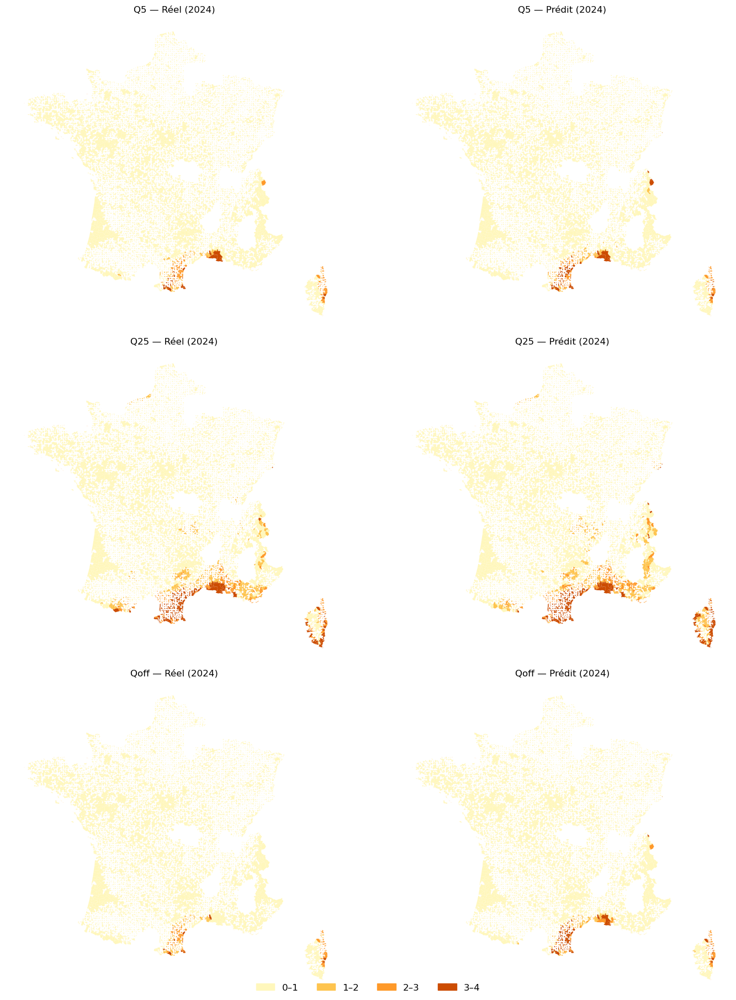

In [ ]:
# ============================================================
# CARTES NATIONALES – INDICATEURS DE SÉCHERESSE
# Réel vs Prédit – Classes discrètes 0–4
# ============================================================
YEAR = 2024  # année de test à cartographier

A5   = annual_sum(df_pred_q5, "5")
A25  = annual_sum(df_pred_q25, "25")
Aoff = annual_sum(df_pred_qoff, "off")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

YEAR_PLOT = 2024  # année à afficher

# ============================================================
# 1) Sécuriser: une géométrie unique par code_insee
# ============================================================
gdf_geom = (
    gdf_commune[["code_insee", "geometry"]]
    .drop_duplicates(subset="code_insee")
    .copy()
)

# (optionnel) pour réduire mémoire
gdf_geom["code_insee"] = gdf_geom["code_insee"].astype(str)

# ============================================================
# 2) Fonction: compresser une table annuelle en 1 ligne par commune
# ============================================================

# ============================================================
# 3) Construire A5, A25, Aoff POUR UNE ANNÉE seulement
#    (IMPORTANT: on ne garde que l'année YEAR_PLOT)
# ============================================================

# Ici on suppose que tu as déjà construit A5/A25/Aoff via annual_sum(...)
# Si ce n'est pas le cas, il faut les reconstruire en filtrant YEAR_PLOT en amont.

A5   = compress_A(A5, "5")
A25  = compress_A(A25, "25")
Aoff = compress_A(Aoff, "off")

# ============================================================
# 4) Attacher les colonnes au GeoDataFrame via mapping (PAS de merge)
# ============================================================
gdf_plot = gdf_geom.copy()

# dictionnaires de mapping: code_insee -> valeur
map_real_5   = dict(zip(A5["code_insee"],   A5["S_real_5"]))
map_pred_5   = dict(zip(A5["code_insee"],   A5["S_pred_5"]))

map_real_25  = dict(zip(A25["code_insee"],  A25["S_real_25"]))
map_pred_25  = dict(zip(A25["code_insee"],  A25["S_pred_25"]))

map_real_off = dict(zip(Aoff["code_insee"], Aoff["S_real_off"]))
map_pred_off = dict(zip(Aoff["code_insee"], Aoff["S_pred_off"]))

# ajout colonnes (très léger)
gdf_plot["S_real_5"]    = gdf_plot["code_insee"].map(map_real_5).fillna(0).astype("int8")
gdf_plot["S_pred_5"]    = gdf_plot["code_insee"].map(map_pred_5).fillna(0).astype("int8")

gdf_plot["S_real_25"]   = gdf_plot["code_insee"].map(map_real_25).fillna(0).astype("int8")
gdf_plot["S_pred_25"]   = gdf_plot["code_insee"].map(map_pred_25).fillna(0).astype("int8")

gdf_plot["S_real_off"]  = gdf_plot["code_insee"].map(map_real_off).fillna(0).astype("int8")
gdf_plot["S_pred_off"]  = gdf_plot["code_insee"].map(map_pred_off).fillna(0).astype("int8")


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import geopandas as gpd

# ============================================================
# 1) PARAMÈTRES COULEURS & CLASSES
# ============================================================

# Classes : [0,1[, [1,2[, [2,3[, [3,4]
bounds = [0, 1, 2, 3, 4.01]
norm = mcolors.BoundaryNorm(bounds, ncolors=4)

# Palette demandée
colors = [
    "#fff7bc",  # jaune pâle
    "#fec44f",  # orange clair
    "#fe9929",  # orange foncé
    "#cc4c02",  # rouge brique
]

cmap = mcolors.ListedColormap(colors)

# ============================================================
# 2) FRONTIÈRES RÉGIONALES UNIQUEMENT
# ============================================================

# gdf_commune doit contenir :
# - geometry
# - code_insee_de_la_region
gdf_regions = (
    gdf_commune
    .dissolve(by="code_insee_de_la_region")
    .boundary
)

# ============================================================
# 3) FONCTION DE TRACE D'UNE CARTE DISCRÈTE
# ============================================================

def plot_discrete_map(ax, gdf, column, title):
    """
    Carte choroplèthe discrète 0–4 avec frontières régionales
    """
    gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0,
        edgecolor="none",
        legend=False  # IMPORTANT : légende manuelle ensuite
    )

    # Frontières régionales
    gdf_regions.plot(
        ax=ax,
        color="none",
        edgecolor="black",
        linewidth=1.0
    )

    ax.set_title(title, fontsize=12)
    ax.axis("off")

# ============================================================
# 4) FIGURE 3 × 2 (Q5 / Q25 / Qoff – Réel vs Prédit)
# ============================================================

fig, axes = plt.subplots(
    3, 2,
    figsize=(14, 18),
    constrained_layout=True
)

pairs = [
    ("S_real_5",   "S_pred_5",   "Q5"),
    ("S_real_25",  "S_pred_25",  "Q25"),
    ("S_real_off", "S_pred_off", "Qoff"),
]

for i, (real_col, pred_col, label) in enumerate(pairs):

    plot_discrete_map(
        axes[i, 0],
        gdf_plot,
        real_col,
        f"{label} — Réel (2024)"
    )

    plot_discrete_map(
        axes[i, 1],
        gdf_plot,
        pred_col,
        f"{label} — Prédit (2024)"
    )

# ============================================================
# 5) LÉGENDE GLOBALE (UNE SEULE)
# ============================================================

legend_patches = [
    mpatches.Patch(color=colors[0], label="0–1"),
    mpatches.Patch(color=colors[1], label="1–2"),
    mpatches.Patch(color=colors[2], label="2–3"),
    mpatches.Patch(color=colors[3], label="3–4"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=4,
    frameon=False,
    fontsize=12
)

plt.show()


→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune


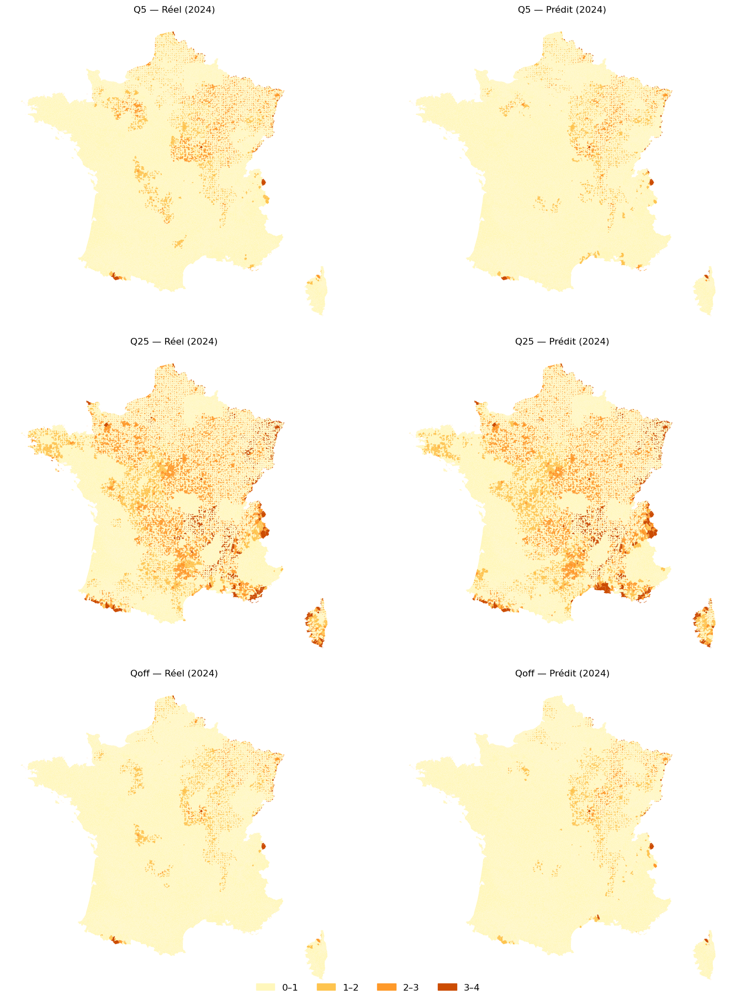

In [ ]:
# ============================================================
# CARTES NATIONALES – INDICATEURS DE SÉCHERESSE
# Réel vs Prédit – Classes discrètes 0–4
# ============================================================
YEAR = 2020  # année de test à cartographier

A5   = annual_sum(df_pred_q5, "5")
A25  = annual_sum(df_pred_q25, "25")
Aoff = annual_sum(df_pred_qoff, "off")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

YEAR_PLOT = 2020  # année à afficher

# ============================================================
# 1) Sécuriser: une géométrie unique par code_insee
# ============================================================
gdf_geom = (
    gdf_commune[["code_insee", "geometry"]]
    .drop_duplicates(subset="code_insee")
    .copy()
)

# (optionnel) pour réduire mémoire
gdf_geom["code_insee"] = gdf_geom["code_insee"].astype(str)

# ============================================================
# 2) Fonction: compresser une table annuelle en 1 ligne par commune
# ============================================================

# ============================================================
# 3) Construire A5, A25, Aoff POUR UNE ANNÉE seulement
#    (IMPORTANT: on ne garde que l'année YEAR_PLOT)
# ============================================================

# Ici on suppose que tu as déjà construit A5/A25/Aoff via annual_sum(...)
# Si ce n'est pas le cas, il faut les reconstruire en filtrant YEAR_PLOT en amont.

A5   = compress_A(A5, "5")
A25  = compress_A(A25, "25")
Aoff = compress_A(Aoff, "off")

# ============================================================
# 4) Attacher les colonnes au GeoDataFrame via mapping (PAS de merge)
# ============================================================
gdf_plot = gdf_geom.copy()

# dictionnaires de mapping: code_insee -> valeur
map_real_5   = dict(zip(A5["code_insee"],   A5["S_real_5"]))
map_pred_5   = dict(zip(A5["code_insee"],   A5["S_pred_5"]))

map_real_25  = dict(zip(A25["code_insee"],  A25["S_real_25"]))
map_pred_25  = dict(zip(A25["code_insee"],  A25["S_pred_25"]))

map_real_off = dict(zip(Aoff["code_insee"], Aoff["S_real_off"]))
map_pred_off = dict(zip(Aoff["code_insee"], Aoff["S_pred_off"]))

# ajout colonnes (très léger)
gdf_plot["S_real_5"]    = gdf_plot["code_insee"].map(map_real_5).fillna(0).astype("int8")
gdf_plot["S_pred_5"]    = gdf_plot["code_insee"].map(map_pred_5).fillna(0).astype("int8")

gdf_plot["S_real_25"]   = gdf_plot["code_insee"].map(map_real_25).fillna(0).astype("int8")
gdf_plot["S_pred_25"]   = gdf_plot["code_insee"].map(map_pred_25).fillna(0).astype("int8")

gdf_plot["S_real_off"]  = gdf_plot["code_insee"].map(map_real_off).fillna(0).astype("int8")
gdf_plot["S_pred_off"]  = gdf_plot["code_insee"].map(map_pred_off).fillna(0).astype("int8")


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import geopandas as gpd

# ============================================================
# 1) PARAMÈTRES COULEURS & CLASSES
# ============================================================

# Classes : [0,1[, [1,2[, [2,3[, [3,4]
bounds = [0, 1, 2, 3, 4.01]
norm = mcolors.BoundaryNorm(bounds, ncolors=4)

# Palette demandée
colors = [
    "#fff7bc",  # jaune pâle
    "#fec44f",  # orange clair
    "#fe9929",  # orange foncé
    "#cc4c02",  # rouge brique
]

cmap = mcolors.ListedColormap(colors)

# ============================================================
# 2) FRONTIÈRES RÉGIONALES UNIQUEMENT
# ============================================================

# gdf_commune doit contenir :
# - geometry
# - code_insee_de_la_region
gdf_regions = (
    gdf_commune
    .dissolve(by="code_insee_de_la_region")
    .boundary
)

# ============================================================
# 3) FONCTION DE TRACE D'UNE CARTE DISCRÈTE
# ============================================================

def plot_discrete_map(ax, gdf, column, title):
    """
    Carte choroplèthe discrète 0–4 avec frontières régionales
    """
    gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0,
        edgecolor="none",
        legend=False  # IMPORTANT : légende manuelle ensuite
    )

    # Frontières régionales
    gdf_regions.plot(
        ax=ax,
        color="none",
        edgecolor="black",
        linewidth=1.0
    )

    ax.set_title(title, fontsize=12)
    ax.axis("off")

# ============================================================
# 4) FIGURE 3 × 2 (Q5 / Q25 / Qoff – Réel vs Prédit)
# ============================================================

fig, axes = plt.subplots(
    3, 2,
    figsize=(14, 18),
    constrained_layout=True
)

pairs = [
    ("S_real_5",   "S_pred_5",   "Q5"),
    ("S_real_25",  "S_pred_25",  "Q25"),
    ("S_real_off", "S_pred_off", "Qoff"),
]

for i, (real_col, pred_col, label) in enumerate(pairs):

    plot_discrete_map(
        axes[i, 0],
        gdf_plot,
        real_col,
        f"{label} — Réel (2020)"
    )

    plot_discrete_map(
        axes[i, 1],
        gdf_plot,
        pred_col,
        f"{label} — Prédit (2020)"
    )

# ============================================================
# 5) LÉGENDE GLOBALE (UNE SEULE)
# ============================================================

legend_patches = [
    mpatches.Patch(color=colors[0], label="0–1"),
    mpatches.Patch(color=colors[1], label="1–2"),
    mpatches.Patch(color=colors[2], label="2–3"),
    mpatches.Patch(color=colors[3], label="3–4"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=4,
    frameon=False,
    fontsize=12
)

plt.show()


→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune


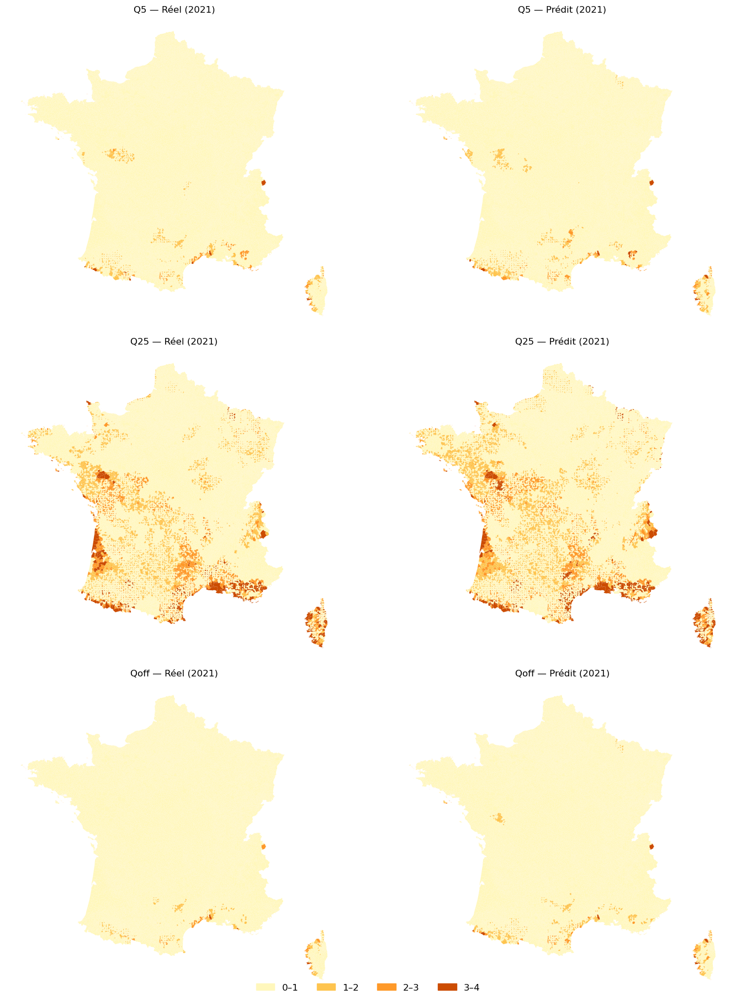

In [32]:
# ============================================================
# CARTES NATIONALES – INDICATEURS DE SÉCHERESSE
# Réel vs Prédit – Classes discrètes 0–4
# ============================================================
YEAR = 2021  # année de test à cartographier

A5   = annual_sum(df_pred_q5, "5")
A25  = annual_sum(df_pred_q25, "25")
Aoff = annual_sum(df_pred_qoff, "off")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

YEAR_PLOT = 2021  # année à afficher

# ============================================================
# 1) Sécuriser: une géométrie unique par code_insee
# ============================================================
gdf_geom = (
    gdf_commune[["code_insee", "geometry"]]
    .drop_duplicates(subset="code_insee")
    .copy()
)

# (optionnel) pour réduire mémoire
gdf_geom["code_insee"] = gdf_geom["code_insee"].astype(str)

# ============================================================
# 2) Fonction: compresser une table annuelle en 1 ligne par commune
# ============================================================

# ============================================================
# 3) Construire A5, A25, Aoff POUR UNE ANNÉE seulement
#    (IMPORTANT: on ne garde que l'année YEAR_PLOT)
# ============================================================

# Ici on suppose que tu as déjà construit A5/A25/Aoff via annual_sum(...)
# Si ce n'est pas le cas, il faut les reconstruire en filtrant YEAR_PLOT en amont.

A5   = compress_A(A5, "5")
A25  = compress_A(A25, "25")
Aoff = compress_A(Aoff, "off")

# ============================================================
# 4) Attacher les colonnes au GeoDataFrame via mapping (PAS de merge)
# ============================================================
gdf_plot = gdf_geom.copy()

# dictionnaires de mapping: code_insee -> valeur
map_real_5   = dict(zip(A5["code_insee"],   A5["S_real_5"]))
map_pred_5   = dict(zip(A5["code_insee"],   A5["S_pred_5"]))

map_real_25  = dict(zip(A25["code_insee"],  A25["S_real_25"]))
map_pred_25  = dict(zip(A25["code_insee"],  A25["S_pred_25"]))

map_real_off = dict(zip(Aoff["code_insee"], Aoff["S_real_off"]))
map_pred_off = dict(zip(Aoff["code_insee"], Aoff["S_pred_off"]))

# ajout colonnes (très léger)
gdf_plot["S_real_5"]    = gdf_plot["code_insee"].map(map_real_5).fillna(0).astype("int8")
gdf_plot["S_pred_5"]    = gdf_plot["code_insee"].map(map_pred_5).fillna(0).astype("int8")

gdf_plot["S_real_25"]   = gdf_plot["code_insee"].map(map_real_25).fillna(0).astype("int8")
gdf_plot["S_pred_25"]   = gdf_plot["code_insee"].map(map_pred_25).fillna(0).astype("int8")

gdf_plot["S_real_off"]  = gdf_plot["code_insee"].map(map_real_off).fillna(0).astype("int8")
gdf_plot["S_pred_off"]  = gdf_plot["code_insee"].map(map_pred_off).fillna(0).astype("int8")


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import geopandas as gpd

# ============================================================
# 1) PARAMÈTRES COULEURS & CLASSES
# ============================================================

# Classes : [0,1[, [1,2[, [2,3[, [3,4]
bounds = [0, 1, 2, 3, 4.01]
norm = mcolors.BoundaryNorm(bounds, ncolors=4)

# Palette demandée
colors = [
    "#fff7bc",  # jaune pâle
    "#fec44f",  # orange clair
    "#fe9929",  # orange foncé
    "#cc4c02",  # rouge brique
]

cmap = mcolors.ListedColormap(colors)

# ============================================================
# 2) FRONTIÈRES RÉGIONALES UNIQUEMENT
# ============================================================

# gdf_commune doit contenir :
# - geometry
# - code_insee_de_la_region
gdf_regions = (
    gdf_commune
    .dissolve(by="code_insee_de_la_region")
    .boundary
)

# ============================================================
# 3) FONCTION DE TRACE D'UNE CARTE DISCRÈTE
# ============================================================

def plot_discrete_map(ax, gdf, column, title):
    """
    Carte choroplèthe discrète 0–4 avec frontières régionales
    """
    gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0,
        edgecolor="none",
        legend=False  # IMPORTANT : légende manuelle ensuite
    )

    # Frontières régionales
    gdf_regions.plot(
        ax=ax,
        color="none",
        edgecolor="black",
        linewidth=1.0
    )

    ax.set_title(title, fontsize=12)
    ax.axis("off")

# ============================================================
# 4) FIGURE 3 × 2 (Q5 / Q25 / Qoff – Réel vs Prédit)
# ============================================================

fig, axes = plt.subplots(
    3, 2,
    figsize=(14, 18),
    constrained_layout=True
)

pairs = [
    ("S_real_5",   "S_pred_5",   "Q5"),
    ("S_real_25",  "S_pred_25",  "Q25"),
    ("S_real_off", "S_pred_off", "Qoff"),
]

for i, (real_col, pred_col, label) in enumerate(pairs):

    plot_discrete_map(
        axes[i, 0],
        gdf_plot,
        real_col,
        f"{label} — Réel (2021)"
    )

    plot_discrete_map(
        axes[i, 1],
        gdf_plot,
        pred_col,
        f"{label} — Prédit (2021)"
    )

# ============================================================
# 5) LÉGENDE GLOBALE (UNE SEULE)
# ============================================================

legend_patches = [
    mpatches.Patch(color=colors[0], label="0–1"),
    mpatches.Patch(color=colors[1], label="1–2"),
    mpatches.Patch(color=colors[2], label="2–3"),
    mpatches.Patch(color=colors[3], label="3–4"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=4,
    frameon=False,
    fontsize=12
)

plt.show()


→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune


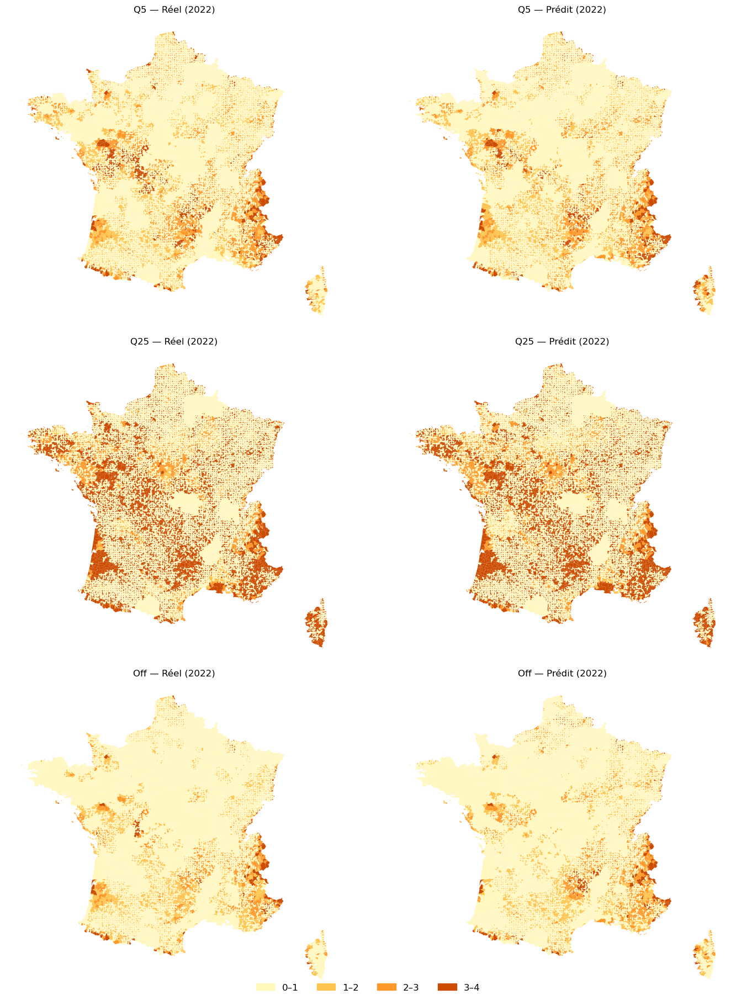

In [36]:
# ============================================================
# CARTES NATIONALES – INDICATEURS DE SÉCHERESSE
# Réel vs Prédit – Classes discrètes 0–4
# ============================================================
YEAR = 2022  # année de test à cartographier

A5   = annual_sum(df_pred_q5, "5")
A25  = annual_sum(df_pred_q25, "25")
Aoff = annual_sum(df_pred_qoff, "off")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

YEAR_PLOT = 2022  # année à afficher

# ============================================================
# 1) Sécuriser: une géométrie unique par code_insee
# ============================================================
gdf_geom = (
    gdf_commune[["code_insee", "geometry"]]
    .drop_duplicates(subset="code_insee")
    .copy()
)

# (optionnel) pour réduire mémoire
gdf_geom["code_insee"] = gdf_geom["code_insee"].astype(str)

# ============================================================
# 2) Fonction: compresser une table annuelle en 1 ligne par commune
# ============================================================

# ============================================================
# 3) Construire A5, A25, Aoff POUR UNE ANNÉE seulement
#    (IMPORTANT: on ne garde que l'année YEAR_PLOT)
# ============================================================

# Ici on suppose que tu as déjà construit A5/A25/Aoff via annual_sum(...)
# Si ce n'est pas le cas, il faut les reconstruire en filtrant YEAR_PLOT en amont.

A5   = compress_A(A5, "5")
A25  = compress_A(A25, "25")
Aoff = compress_A(Aoff, "off")

# ============================================================
# 4) Attacher les colonnes au GeoDataFrame via mapping (PAS de merge)
# ============================================================
gdf_plot = gdf_geom.copy()

# dictionnaires de mapping: code_insee -> valeur
map_real_5   = dict(zip(A5["code_insee"],   A5["S_real_5"]))
map_pred_5   = dict(zip(A5["code_insee"],   A5["S_pred_5"]))

map_real_25  = dict(zip(A25["code_insee"],  A25["S_real_25"]))
map_pred_25  = dict(zip(A25["code_insee"],  A25["S_pred_25"]))

map_real_off = dict(zip(Aoff["code_insee"], Aoff["S_real_off"]))
map_pred_off = dict(zip(Aoff["code_insee"], Aoff["S_pred_off"]))

# ajout colonnes (très léger)
gdf_plot["S_real_5"]    = gdf_plot["code_insee"].map(map_real_5).fillna(0).astype("int8")
gdf_plot["S_pred_5"]    = gdf_plot["code_insee"].map(map_pred_5).fillna(0).astype("int8")

gdf_plot["S_real_25"]   = gdf_plot["code_insee"].map(map_real_25).fillna(0).astype("int8")
gdf_plot["S_pred_25"]   = gdf_plot["code_insee"].map(map_pred_25).fillna(0).astype("int8")

gdf_plot["S_real_off"]  = gdf_plot["code_insee"].map(map_real_off).fillna(0).astype("int8")
gdf_plot["S_pred_off"]  = gdf_plot["code_insee"].map(map_pred_off).fillna(0).astype("int8")


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import geopandas as gpd

# ============================================================
# 1) PARAMÈTRES COULEURS & CLASSES
# ============================================================

# Classes : [0,1[, [1,2[, [2,3[, [3,4]
bounds = [0, 1, 2, 3, 4.01]
norm = mcolors.BoundaryNorm(bounds, ncolors=4)

# Palette demandée
colors = [
    "#fff7bc",  # jaune pâle
    "#fec44f",  # orange clair
    "#fe9929",  # orange foncé
    "#cc4c02",  # rouge brique
]

cmap = mcolors.ListedColormap(colors)

# ============================================================
# 2) FRONTIÈRES RÉGIONALES UNIQUEMENT
# ============================================================

# gdf_commune doit contenir :
# - geometry
# - code_insee_de_la_region
gdf_regions = (
    gdf_commune
    .dissolve(by="code_insee_de_la_region")
    .boundary
)

# ============================================================
# 3) FONCTION DE TRACE D'UNE CARTE DISCRÈTE
# ============================================================

def plot_discrete_map(ax, gdf, column, title):
    """
    Carte choroplèthe discrète 0–4 avec frontières régionales
    """
    gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0,
        edgecolor="none",
        legend=False  # IMPORTANT : légende manuelle ensuite
    )

    # Frontières régionales
    gdf_regions.plot(
        ax=ax,
        color="none",
        edgecolor="black",
        linewidth=1.0
    )

    ax.set_title(title, fontsize=12)
    ax.axis("off")

# ============================================================
# 4) FIGURE 3 × 2 (Q5 / Q25 / Qoff – Réel vs Prédit)
# ============================================================

fig, axes = plt.subplots(
    3, 2,
    figsize=(14, 18),
    constrained_layout=True
)

pairs = [
    ("S_real_5",   "S_pred_5",   "Q5"),
    ("S_real_25",  "S_pred_25",  "Q25"),
    ("S_real_off", "S_pred_off", "Off"),
]

for i, (real_col, pred_col, label) in enumerate(pairs):

    plot_discrete_map(
        axes[i, 0],
        gdf_plot,
        real_col,
        f"{label} — Réel (2022)"
    )

    plot_discrete_map(
        axes[i, 1],
        gdf_plot,
        pred_col,
        f"{label} — Prédit (2022)"
    )

# ============================================================
# 5) LÉGENDE GLOBALE (UNE SEULE)
# ============================================================

legend_patches = [
    mpatches.Patch(color=colors[0], label="0–1"),
    mpatches.Patch(color=colors[1], label="1–2"),
    mpatches.Patch(color=colors[2], label="2–3"),
    mpatches.Patch(color=colors[3], label="3–4"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=4,
    frameon=False,
    fontsize=12
)

plt.show()


→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune


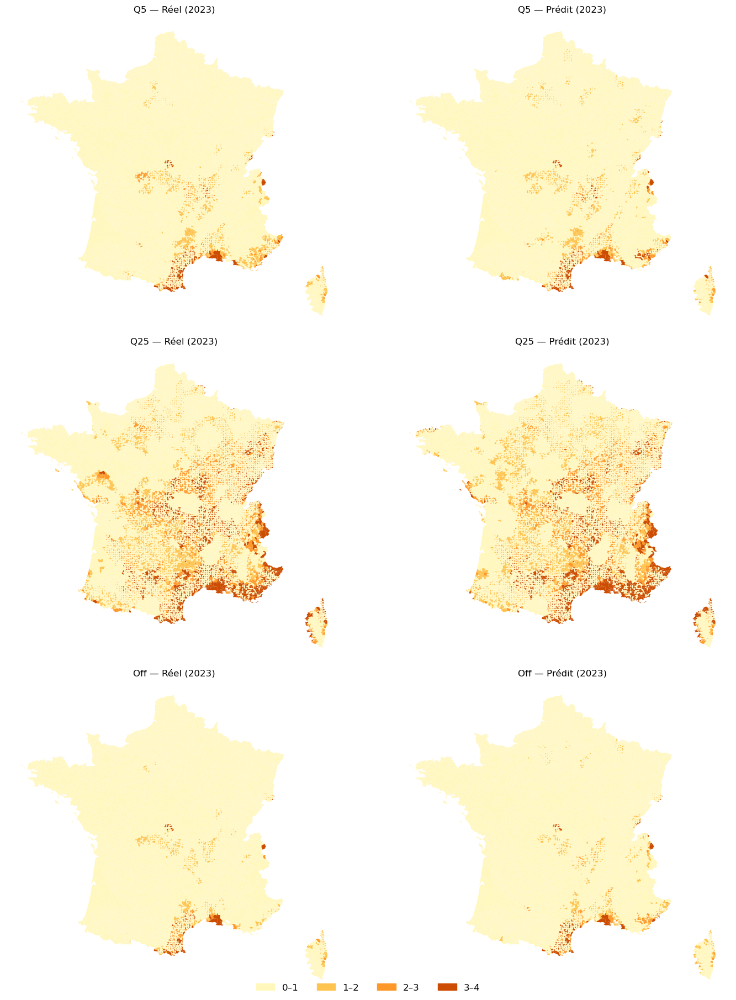

In [35]:
# ============================================================
# CARTES NATIONALES – INDICATEURS DE SÉCHERESSE
# Réel vs Prédit – Classes discrètes 0–4
# ============================================================
YEAR = 2023  # année de test à cartographier

A5   = annual_sum(df_pred_q5, "5")
A25  = annual_sum(df_pred_q25, "25")
Aoff = annual_sum(df_pred_qoff, "off")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

YEAR_PLOT = 2023  # année à afficher

# ============================================================
# 1) Sécuriser: une géométrie unique par code_insee
# ============================================================
gdf_geom = (
    gdf_commune[["code_insee", "geometry"]]
    .drop_duplicates(subset="code_insee")
    .copy()
)

# (optionnel) pour réduire mémoire
gdf_geom["code_insee"] = gdf_geom["code_insee"].astype(str)

# ============================================================
# 2) Fonction: compresser une table annuelle en 1 ligne par commune
# ============================================================

# ============================================================
# 3) Construire A5, A25, Aoff POUR UNE ANNÉE seulement
#    (IMPORTANT: on ne garde que l'année YEAR_PLOT)
# ============================================================

# Ici on suppose que tu as déjà construit A5/A25/Aoff via annual_sum(...)
# Si ce n'est pas le cas, il faut les reconstruire en filtrant YEAR_PLOT en amont.

A5   = compress_A(A5, "5")
A25  = compress_A(A25, "25")
Aoff = compress_A(Aoff, "off")

# ============================================================
# 4) Attacher les colonnes au GeoDataFrame via mapping (PAS de merge)
# ============================================================
gdf_plot = gdf_geom.copy()

# dictionnaires de mapping: code_insee -> valeur
map_real_5   = dict(zip(A5["code_insee"],   A5["S_real_5"]))
map_pred_5   = dict(zip(A5["code_insee"],   A5["S_pred_5"]))

map_real_25  = dict(zip(A25["code_insee"],  A25["S_real_25"]))
map_pred_25  = dict(zip(A25["code_insee"],  A25["S_pred_25"]))

map_real_off = dict(zip(Aoff["code_insee"], Aoff["S_real_off"]))
map_pred_off = dict(zip(Aoff["code_insee"], Aoff["S_pred_off"]))

# ajout colonnes (très léger)
gdf_plot["S_real_5"]    = gdf_plot["code_insee"].map(map_real_5).fillna(0).astype("int8")
gdf_plot["S_pred_5"]    = gdf_plot["code_insee"].map(map_pred_5).fillna(0).astype("int8")

gdf_plot["S_real_25"]   = gdf_plot["code_insee"].map(map_real_25).fillna(0).astype("int8")
gdf_plot["S_pred_25"]   = gdf_plot["code_insee"].map(map_pred_25).fillna(0).astype("int8")

gdf_plot["S_real_off"]  = gdf_plot["code_insee"].map(map_real_off).fillna(0).astype("int8")
gdf_plot["S_pred_off"]  = gdf_plot["code_insee"].map(map_pred_off).fillna(0).astype("int8")


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import geopandas as gpd

# ============================================================
# 1) PARAMÈTRES COULEURS & CLASSES
# ============================================================

# Classes : [0,1[, [1,2[, [2,3[, [3,4]
bounds = [0, 1, 2, 3, 4.01]
norm = mcolors.BoundaryNorm(bounds, ncolors=4)

# Palette demandée
colors = [
    "#fff7bc",  # jaune pâle
    "#fec44f",  # orange clair
    "#fe9929",  # orange foncé
    "#cc4c02",  # rouge brique
]

cmap = mcolors.ListedColormap(colors)

# ============================================================
# 2) FRONTIÈRES RÉGIONALES UNIQUEMENT
# ============================================================

# gdf_commune doit contenir :
# - geometry
# - code_insee_de_la_region
gdf_regions = (
    gdf_commune
    .dissolve(by="code_insee_de_la_region")
    .boundary
)

# ============================================================
# 3) FONCTION DE TRACE D'UNE CARTE DISCRÈTE
# ============================================================

def plot_discrete_map(ax, gdf, column, title):
    """
    Carte choroplèthe discrète 0–4 avec frontières régionales
    """
    gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0,
        edgecolor="none",
        legend=False  # IMPORTANT : légende manuelle ensuite
    )

    # Frontières régionales
    gdf_regions.plot(
        ax=ax,
        color="none",
        edgecolor="black",
        linewidth=1.0
    )

    ax.set_title(title, fontsize=12)
    ax.axis("off")

# ============================================================
# 4) FIGURE 3 × 2 (Q5 / Q25 / Qoff – Réel vs Prédit)
# ============================================================

fig, axes = plt.subplots(
    3, 2,
    figsize=(14, 18),
    constrained_layout=True
)

pairs = [
    ("S_real_5",   "S_pred_5",   "Q5"),
    ("S_real_25",  "S_pred_25",  "Q25"),
    ("S_real_off", "S_pred_off", "Off"),
]

for i, (real_col, pred_col, label) in enumerate(pairs):

    plot_discrete_map(
        axes[i, 0],
        gdf_plot,
        real_col,
        f"{label} — Réel (2023)"
    )

    plot_discrete_map(
        axes[i, 1],
        gdf_plot,
        pred_col,
        f"{label} — Prédit (2023)"
    )

# ============================================================
# 5) LÉGENDE GLOBALE (UNE SEULE)
# ============================================================

legend_patches = [
    mpatches.Patch(color=colors[0], label="0–1"),
    mpatches.Patch(color=colors[1], label="1–2"),
    mpatches.Patch(color=colors[2], label="2–3"),
    mpatches.Patch(color=colors[3], label="3–4"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=4,
    frameon=False,
    fontsize=12
)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd

# Classes : [0,1[, [1,2[, [2,3[, [3,4]
bounds = [0, 1, 2, 3, 4.01]  # 4.01 pour inclure 4
norm = mcolors.BoundaryNorm(bounds, ncolors=4)

# Couleurs bien contrastées (tu peux changer)
colors = [
    "#edf8fb",  # 0–1 : très clair
    "#AA9418",  # 1–2
    "#66c2a4",  # 2–3
    "#238b45",  # 3–4 : foncé
]

cmap = mcolors.ListedColormap(colors)

gdf_regions = (
    gdf_commune
    .dissolve(by="code_insee_de_la_region")
    .boundary
)



def plot_discrete_map(ax, gdf, column, title):
    # Plot principal
    plot = gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0,
        edgecolor="none",
        legend=True,
        legend_kwds={
            "ticks": [0.5, 1.5, 2.5, 3.5],
            "shrink": 0.7
        }
    )

    # Récupérer la colorbar et renommer les classes
    cbar = plot.get_figure().axes[-1]
    cbar.set_yticklabels(["0–1", "1–2", "2–3", "3–4"])

    # Frontières régionales
    gdf_regions.plot(
        ax=ax,
        color="none",
        edgecolor="black",
        linewidth=0.8
    )

    ax.set_title(title, fontsize=12)
    ax.axis("off")


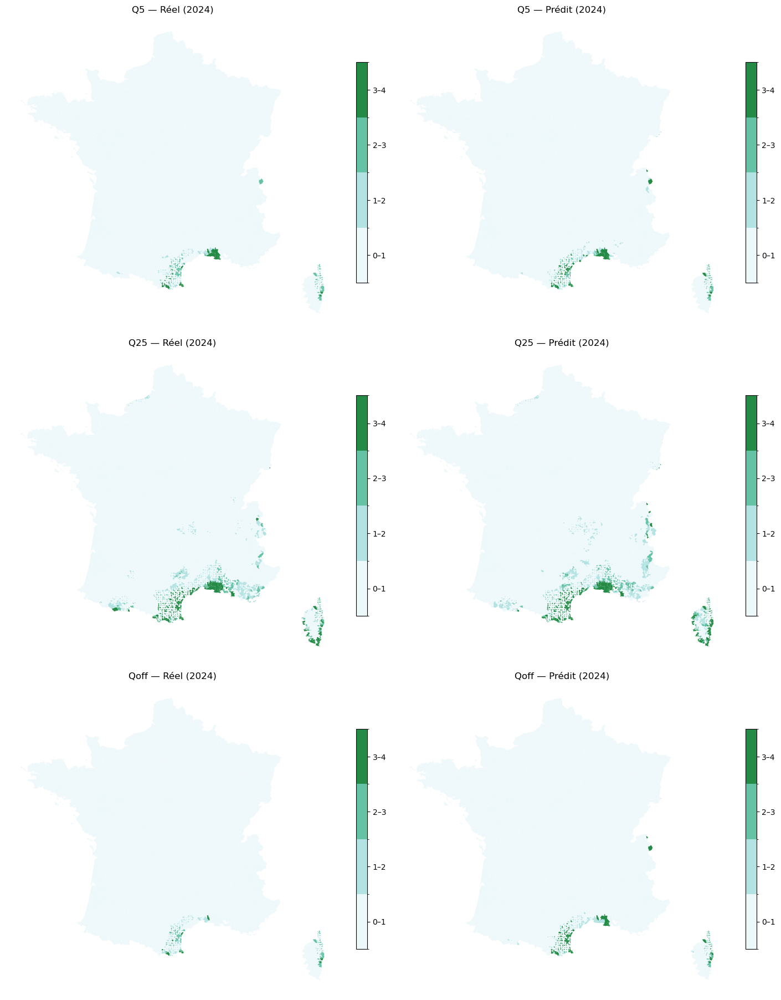

In [37]:
fig, axes = plt.subplots(3, 2, figsize=(14, 18), constrained_layout=True)

pairs = [
    ("S_real_5",   "S_pred_5",   "Q5"),
    ("S_real_25",  "S_pred_25",  "Q25"),
    ("S_real_off", "S_pred_off", "Qoff"),
]

for i, (real_col, pred_col, label) in enumerate(pairs):

    plot_discrete_map(
        axes[i, 0],
        gdf_plot,
        real_col,
        f"{label} — Réel (2024)"
    )

    plot_discrete_map(
        axes[i, 1],
        gdf_plot,
        pred_col,
        f"{label} — Prédit (2024)"
    )

plt.show()


In [17]:
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"
gdf_regions = gpd.read_file(LimitAdmin, layer="region").to_crs(2154)
gdf_commune = gpd.read_file(LimitAdmin, layer="commune").to_crs(2154)

In [23]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

YEAR_PLOT = 2024  # année à afficher

# ============================================================
# 1) Sécuriser: une géométrie unique par code_insee
# ============================================================
gdf_geom = (
    gdf_commune[["code_insee", "geometry"]]
    .drop_duplicates(subset="code_insee")
    .copy()
)

# (optionnel) pour réduire mémoire
gdf_geom["code_insee"] = gdf_geom["code_insee"].astype(str)

# ============================================================
# 2) Fonction: compresser une table annuelle en 1 ligne par commune
# ============================================================

# ============================================================
# 3) Construire A5, A25, Aoff POUR UNE ANNÉE seulement
#    (IMPORTANT: on ne garde que l'année YEAR_PLOT)
# ============================================================

# Ici on suppose que tu as déjà construit A5/A25/Aoff via annual_sum(...)
# Si ce n'est pas le cas, il faut les reconstruire en filtrant YEAR_PLOT en amont.

A5   = compress_A(A5, "5")
A25  = compress_A(A25, "25")
Aoff = compress_A(Aoff, "off")

# ============================================================
# 4) Attacher les colonnes au GeoDataFrame via mapping (PAS de merge)
# ============================================================
gdf_plot = gdf_geom.copy()

# dictionnaires de mapping: code_insee -> valeur
map_real_5   = dict(zip(A5["code_insee"],   A5["S_real_5"]))
map_pred_5   = dict(zip(A5["code_insee"],   A5["S_pred_5"]))

map_real_25  = dict(zip(A25["code_insee"],  A25["S_real_25"]))
map_pred_25  = dict(zip(A25["code_insee"],  A25["S_pred_25"]))

map_real_off = dict(zip(Aoff["code_insee"], Aoff["S_real_off"]))
map_pred_off = dict(zip(Aoff["code_insee"], Aoff["S_pred_off"]))

# ajout colonnes (très léger)
gdf_plot["S_real_5"]    = gdf_plot["code_insee"].map(map_real_5).fillna(0).astype("int8")
gdf_plot["S_pred_5"]    = gdf_plot["code_insee"].map(map_pred_5).fillna(0).astype("int8")

gdf_plot["S_real_25"]   = gdf_plot["code_insee"].map(map_real_25).fillna(0).astype("int8")
gdf_plot["S_pred_25"]   = gdf_plot["code_insee"].map(map_pred_25).fillna(0).astype("int8")

gdf_plot["S_real_off"]  = gdf_plot["code_insee"].map(map_real_off).fillna(0).astype("int8")
gdf_plot["S_pred_off"]  = gdf_plot["code_insee"].map(map_pred_off).fillna(0).astype("int8")


→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune
→ colonne INSEE détectée : code_insee_commune
